In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
cd drive/MyDrive/mmdetection

/content/drive/MyDrive/mmdetection


In [3]:
!nvcc -V
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
Copyright (C) 2021 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [4]:
import torch
print(torch.version.cuda)

11.8


In [5]:
%pip install -U openmim
!mim install "mmengine>=0.7.0"
!mim install "mmcv>=2.0.0rc4"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.2/289.2 kB 29.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 25.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 502.3/502.3 kB 47.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.1/953.1 kB 61.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.8/70.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.5/440.5 kB 41.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for oss2: filename=oss2-2.17.0-py3-none-any.whl size=112

Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 437.2/437.2 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 8.1 MB/s eta 0:00:00
  Attempting uninstall: importlib-metadata
    Found existing installation: importlib-metadata 4.6.4
    Uninstalling importlib-metadata-4.6.4:
      Successfully uninstalled importlib-metadata-4.6.4
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.4/74.4 MB 15.1 MB/s eta 0:00:00


In [ ]:
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

%pip install -e .

Cloning into 'mmdetection'...
remote: Enumerating objects: 36774, done.
remote: Counting objects: 100% (264/264), done.
remote: Compressing objects: 100% (180/180), done.
remote: Total 36774 (delta 95), reused 196 (delta 83), pack-reused 36510
Receiving objects: 100% (36774/36774), 57.05 MiB | 15.34 MiB/s, done.
Resolving deltas: 100% (25771/25771), done.
Updating files: 100% (2136/2136), done.
/content/drive/MyDrive/mmdetection/mmdetection
Obtaining file:///content/drive/MyDrive/mmdetection/mmdetection
  Preparing metadata (setup.py) ... done
  Attempting uninstall: mmdet
    Found existing installation: mmdet 3.1.0
    Uninstalling mmdet-3.1.0:
      Successfully uninstalled mmdet-3.1.0
  Running setup.py develop for mmdet


In [6]:
!mim install mmdet

Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 8.1 MB/s eta 0:00:00


In [7]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet


def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

sys.platform: linux
Python: 3.10.12 (main, Jun 11 2023, 05:26:28) [GCC 11.4.0]
CUDA available: True
numpy_random_seed: 2147483648
GPU 0: Tesla T4
CUDA_HOME: /usr/local/cuda
NVCC: Cuda compilation tools, release 11.8, V11.8.89
GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
PyTorch: 2.0.1+cu118
PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,code=sm_80;

In [8]:
!pwd

/content/drive/MyDrive/mmdetection


In [9]:
!mkdir ./checkpoints
!mim download mmdet --config rtmdet_m_8xb32-300e_coco --dest ./checkpoints

mkdir: cannot create directory ‘./checkpoints’: File exists
processing rtmdet_m_8xb32-300e_coco...
rtmdet_m_8xb32-300e_coco_20220719_112220-229f527c.pth exists in /content/drive/MyDrive/mmdetection/checkpoints
Successfully dumped rtmdet_m_8xb32-300e_coco.py to /content/drive/MyDrive/mmdetection/checkpoints


In [10]:
import json, os
from mmengine.fileio import dump, load

def convertImagesToCoco(ann_file, out_file):

    original_annotations = load(ann_file)

    categories = [
        {'id': 1, 'name': 'penguin', 'supercategory': ''},
        {'id': 2, 'name': 'turtle', 'supercategory': ''}
    ]

    annotations = []
    images = []

    for ann in original_annotations:

        bbox = ann['bbox']
        new_image = {
            "id": ann['id'],
            "width": abs(bbox[2] - bbox[0]),
            "height": abs(bbox[3] - bbox[1]),
            "file_name": "image_id_" + str(ann["image_id"]).zfill(3)+".jpg",
        }


        new_ann = {
            'id': ann['id'],
            'image_id': ann['image_id'],
            'category_id': ann['category_id'],
            'segmentation': [],
            'area': ann['area'],
            'bbox': [bbox[0], bbox[1], abs(bbox[2] - bbox[0]), abs(bbox[3] - bbox[1])],  # Convert to [x, y, width, height]
            'iscrowd': ann.get('iscrowd', 0),  # Use 0 if iscrowd is not provided
        }
        annotations.append(new_ann)
        images.append(new_image)

    coco_format = {
        "images": images,
        "annotations": annotations,
        "categories": categories,
    }

    dump(coco_format, out_file)

if __name__ == '__main__':

    with open('./archive/train_annotations', 'r') as f:
        train_annotations = json.load(f)

    with open('./archive/valid_annotations', 'r') as f:
        valid_annotations = json.load(f)

    with open('./archive/train/train_annotations.json', 'w') as f:
        json.dump(train_annotations, f)

    with open('./archive/valid/valid_annotations.json', 'w') as f:
        json.dump(valid_annotations, f)


    convertImagesToCoco(ann_file='./archive/train/train_annotations.json',
                            out_file='./archive/train_annotations_coco.json')
    convertImagesToCoco(ann_file='./archive/valid/valid_annotations.json',
                            out_file='./archive/valid_annotations_coco.json')

In [11]:
config_penguin_turtle_modified = """
# Inherit and overwrite part of the config based on this config
_base_ = './rtmdet_m_8xb32-300e_coco.py'

data_root = './archive/'

train_batch_size_per_gpu = 4
train_num_workers = 2

max_epochs = 20
stage2_num_epochs = 1
base_lr = 0.00008

metainfo = {
    'classes': ('penguin', 'turtle'),
    'palette': [
        (220, 20, 60),
        (0, 255, 0),
    ]
}

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='train/train'),
        ann_file='train_annotations_coco.json'))  # Update to COCO format annotations

val_dataloader = dict(
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='valid/valid'),
        ann_file='valid_annotations_coco.json'))  # Update to COCO format annotations

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'valid_annotations_coco.json')  # Update to COCO format annotations

test_evaluator = val_evaluator

model = dict(bbox_head=dict(num_classes=2))

# learning rate
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=10),
    dict(
        # use cosine lr from 10 to 20 epoch
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]

train_pipeline_stage2 = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='RandomResize',
        scale=(640, 640),
        ratio_range=(0.1, 2.0),
        keep_ratio=True),
    dict(type='RandomCrop', crop_size=(640, 640)),
    dict(type='YOLOXHSVRandomAug'),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

# optimizer
optim_wrapper = dict(
    _delete_=True,
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.05),
    paramwise_cfg=dict(
        norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

default_hooks = dict(
    checkpoint=dict(
        interval=5,
        max_keep_ckpts=2,  # only keep latest 2 checkpoints
        save_best='auto'
    ),
    logger=dict(type='LoggerHook', interval=5))

custom_hooks = [
    dict(
        type='PipelineSwitchHook',
        switch_epoch=max_epochs - stage2_num_epochs,
        switch_pipeline=train_pipeline_stage2)
]

# load COCO pre-trained weight
load_from = './checkpoints/rtmdet_m_8xb32-300e_coco_20220719_112220-229f527c.pth'

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)

visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""

with open('configs/rtmdet/rtmdet_m_8xb32-300e_pt.py', 'w') as f:
    f.write(config_penguin_turtle_modified)


In [ ]:
!python tools/train.py configs/rtmdet/rtmdet_m_8xb32-300e_pt.py

08/01 06:57:32 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.6 (main, May 29 2023, 11:10:38) [GCC 11.3.0]
    CUDA available: True
    numpy_random_seed: 526727187
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.3.0-1ubuntu1~22.04.1) 11.3.0
    PyTorch: 2.0.1+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_5

In [ ]:
# load tensorboard in colab
%reload_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir ./work_dirs

<IPython.core.display.Javascript object>

In [ ]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = 'configs/rtmdet/rtmdet_m_8xb32-300e_pt.py'

# Setup a checkpoint file to load
checkpoint = glob.glob('./work_dirs/rtmdet_m_8xb32-300e_pt/best_coco*.pth')[0]

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

img_dir = '/content/drive/MyDrive/mmdetection/archive/valid/valid/'

# Use the detector to do inference
for img_path in glob.glob(img_dir + '**/*.jpg', recursive=True):
    result_m = inferencer(img_path, out_dir='./output/m')

Loads checkpoint by local backend from path: ./work_dirs/rtmdet_m_8xb32-300e_pt/best_coco_bbox_mAP_epoch_19.pth
08/01 07:15:44 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.


Output()

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming 
release, it will be required to pass the indexing argument. (Triggered internally at 
../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:746: UserWarning: Warning: The bbox is
out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:817: UserWarning: Warning: The polygon
is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

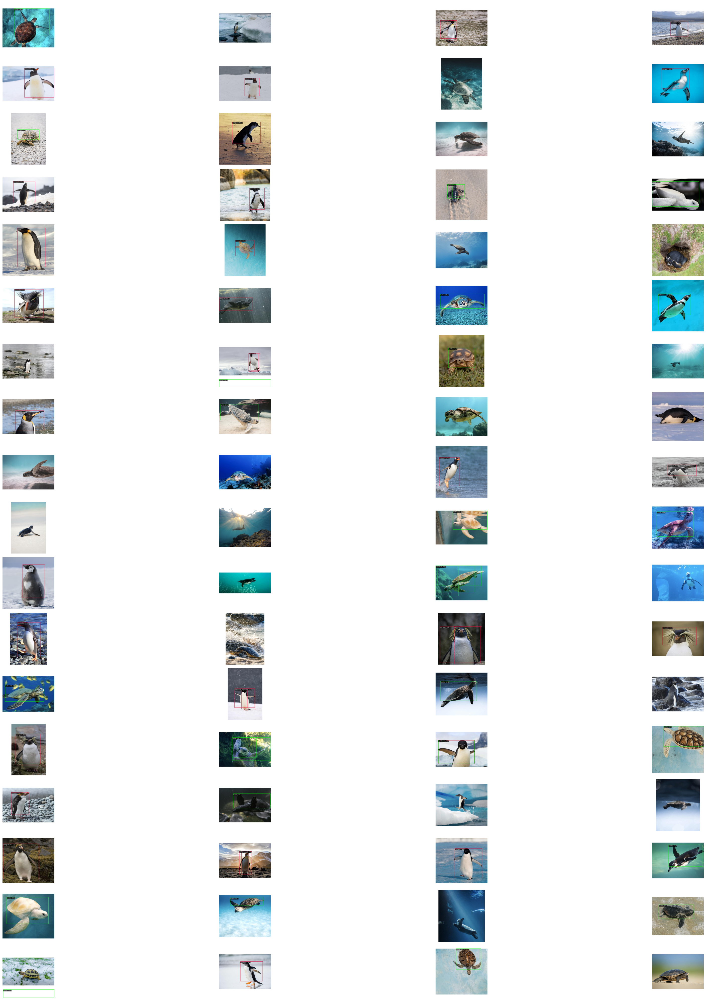

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Directory where the output images are located
output_dir = './output/m/vis/'

# Get all .jpg files in the directory
img_files = [f for f in os.listdir(output_dir) if f.endswith('.jpg')]

# Create a figure to display the images
fig = plt.figure(figsize=(40, 40))  # You may need to adjust this to fit your images

# Calculate the number of rows needed
n_rows = len(img_files) // 4
if len(img_files) % 4:
    n_rows += 1

# Loop over the image files and display each one
for i, img_file in enumerate(img_files):
    img_path = os.path.join(output_dir, img_file)
    img = Image.open(img_path)

    # Create a subplot for each image
    ax = fig.add_subplot(n_rows, 4, i+1)
    ax.imshow(img)
    ax.axis('off')  # Hide the axes

# Show the figure with all images
plt.tight_layout()
plt.show()

In [12]:
!pwd

/content/drive/MyDrive/mmdetection


In [15]:
!python tools/test.py configs/rtmdet/rtmdet_m_8xb32-300e_pt.py work_dirs/rtmdet_m_8xb32-300e_pt/best_coco_bbox_mAP_epoch_19.pth --out result.pkl

08/03 00:19:32 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Jun 11 2023, 05:26:28) [GCC 11.4.0]
    CUDA available: True
    numpy_random_seed: 1319123301
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_5

In [ ]:
import pickle

f = open('./results.pkl', 'rb')
info = pickle.load(f)
print(info)

[{'batch_input_shape': (640, 640), 'img_path': './archive/valid/valid/image_id_000.jpg', 'scale_factor': (1.0, 1.0), 'ori_shape': (640, 640), 'img_shape': (640, 640), 'pad_shape': (640, 640), 'img_id': 0, 'pred_instances': {'bboxes': tensor([[248.0650,  93.1562, 520.5714, 502.1336],
        [224.8420,  93.4604, 421.9901, 468.3273],
        [335.6936,  93.6432, 523.1815, 488.9796],
        ...,
        [  2.1157,   0.0000, 623.9017,  96.8298],
        [  0.0000, 540.5513,  18.1595, 636.6905],
        [607.5934, 615.3679, 640.0000, 640.0000]]), 'scores': tensor([0.3976, 0.2163, 0.2102, 0.1409, 0.1365, 0.1232, 0.1160, 0.1159, 0.1011,
        0.0986, 0.0935, 0.0914, 0.0805, 0.0714, 0.0709, 0.0695, 0.0677, 0.0661,
        0.0645, 0.0632, 0.0611, 0.0528, 0.0525, 0.0505, 0.0475, 0.0473, 0.0470,
        0.0470, 0.0457, 0.0451, 0.0447, 0.0438, 0.0434, 0.0433, 0.0432, 0.0408,
        0.0400, 0.0393, 0.0381, 0.0372, 0.0369, 0.0361, 0.0361, 0.0360, 0.0358,
        0.0357, 0.0357, 0.0355, 0.0353, 0